# Shearwater Bay - Development Plan

### 1) Importing necessary tools

In [13]:
# to create data tables
import numpy as np
import geopandas as gpd
import pandas as pd
import os

# to transform UTM to WGS84
from shapely.geometry import Polygon
from pyproj import Proj, transform

# to create the interactive map
import folium
from folium import Popup
from folium.plugins import MarkerCluster
import json

# to parse the KML files and plot the polygons
from fastkml import kml
from shapely.geometry import Polygon, Point, LineString
from xml.dom.minidom import parseString

# Add widgets
from IPython.display import display
import ipywidgets as widgets
from IPython.display import display, clear_output
from datetime import date

# ignore warnings
import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning, module="pyproj")
warnings.filterwarnings("ignore", category=UserWarning, module="openpyxl")
warnings.filterwarnings("ignore", category=DeprecationWarning)


### 2) Input & Output file and parameters

In [14]:
## Input
file_input ='C:/Users/Samob/Kelp Blue/Forestry - Engineering - Documents/Namibia/B. Development Plan/Shearwater Bay Development Plan.xlsx'
## Input License areas (kml files)
path_kml = 'C:/Users/Samob\Kelp Blue/Forestry - Engineering - Documents/Namibia/B. Development Plan/'
kml_imported= [
    'Development Plan - Input/Plot A - 100 ha.kml',
    'Development Plan - Input/Plot B - 100 ha.kml',
    'Development Plan - Input/Plot C - 115 ha.kml',
    'Development Plan - Input/Plot D - 105 ha.kml',
    'Development Plan - Input/Plot E - 100 ha.kml',
    'Development Plan - Input/Plot F - 100 ha.kml']
kml_files=[]
for i in range(len(kml_imported)): 
    kml_files.append(path_kml+kml_imported[i])
## Output 
formatted_date = date.today()
map_output_location = 'C:/Users/Samob/Kelp Blue/Forestry - Engineering - Documents/Namibia/B. Development Plan/Development Plan - Output/Town_Planning_Maps'
file_output = f'{map_output_location}/{formatted_date}.html'

<>:4: SyntaxWarning: invalid escape sequence '\K'
<>:4: SyntaxWarning: invalid escape sequence '\K'
C:\Users\Samob\AppData\Local\Temp\ipykernel_19992\1585418098.py:4: SyntaxWarning: invalid escape sequence '\K'
  path_kml = 'C:/Users/Samob\Kelp Blue/Forestry - Engineering - Documents/Namibia/B. Development Plan/'


### 3) Functions used in the script

In [15]:
# Function to Extract Coordinates from KML
import xml.etree.ElementTree as ET

def extract_coordinates_from_kml(kml_path):
    """Extract polygon coordinates from a KML file."""
    with open(kml_path, 'r') as f:
        doc = f.read()

    # Parse the KML content
    kml = parseString(doc)
    coordinates = []

    # Find all Polygon coordinates in the KML
    for placemark in kml.getElementsByTagName('Placemark'):
        for polygon in placemark.getElementsByTagName('Polygon'):
            for outer_boundary in polygon.getElementsByTagName('outerBoundaryIs'):
                for linear_ring in outer_boundary.getElementsByTagName('LinearRing'):
                    for coord in linear_ring.getElementsByTagName('coordinates'):
                        coords_text = coord.firstChild.nodeValue.strip()
                        coords = coords_text.split(" ")
                        coords = [(float(c.split(",")[1]), float(c.split(",")[0])) for c in coords]
                        coordinates.append(coords)
    return coordinates


def extract_linecoordinates_kml(kml_file_path):
    tree = ET.parse(kml_file_path)
    root = tree.getroot()

    coordinates = []

    # Iterate through Placemark elements in KML
    for placemark in root.iter('{http://www.opengis.net/kml/2.2}Placemark'):
        # Find the coordinates element
        coordinates_element = placemark.find('.//{http://www.opengis.net/kml/2.2}coordinates')

        if coordinates_element is not None:
            # Extract and split the coordinates
            coordinates_text = coordinates_element.text.strip()
            coordinates_list = [tuple(map(float, coord.split(',')[:2])) for coord in coordinates_text.split()]

            # Add the coordinates to the list
            coordinates.extend(coordinates_list)

    return coordinates

### UTM to latlon

def utm_to_latlon(row, easting_col, northing_col):
    # Define the UTM and WGS84 projections
    utm_zone = 33  # Adjust the UTM zone based on your data
    utm33 = Proj(init=f'epsg:326{utm_zone}')
    wgs84 = Proj(init='epsg:4326')

    # Check if the 'easting' and 'northing' values are already numeric
    easting = row[easting_col]
    northing = row[northing_col]

    # Handle non-numeric values
    try:
        if not pd.api.types.is_numeric_dtype(easting):
            easting = pd.to_numeric(str(easting).replace(',', ''))

        if not pd.api.types.is_numeric_dtype(northing):
            northing = pd.to_numeric(str(northing).replace(',', ''))
    except ValueError:
        # Handle the case where conversion fails (e.g., non-numeric values)
        print(f"Skipping row {row.name} due to non-numeric values.")
        return pd.Series({'lat': None, 'lon': None})

    # Convert UTM to lat/lon
    northing = 10000000 - northing  # adjust for the southern hemisphere
    lon, lat = transform(utm33, wgs84, easting, northing)

    # Return a pandas Series with the new columns
    return pd.Series({'lat': -lat, 'lon': lon})

'''def utm_to_latlon_anchors(row,easting_col,northing_col):
    # Define the UTM and WGS84 projections
    utm_zone = 33  # Adjust the UTM zone based on your data
    utm33 = Proj(init=f'epsg:326{utm_zone}')
    wgs84 = Proj(init='epsg:4326')

    # Check if the 'easting' and 'northing' values are already numeric
    easting = row[easting_col]
    northing = row[northing_col]

    if not pd.api.types.is_numeric_dtype(easting):
        easting = pd.to_numeric(str(easting).replace(',', ''))

    if not pd.api.types.is_numeric_dtype(northing):
        northing = pd.to_numeric(str(northing).replace(',', ''))

    # Convert UTM to lat/lon
    northing = 10000000 - northing  # adjust for the southern hemisphere
    lon, lat = transform(utm33, wgs84, easting, northing)

    # Return a pandas Series with the new columns
    return pd.Series({'lat': -lat, 'lon': lon})'''



utm33 = Proj(proj='utm', zone=33, ellps='WGS84', preserve_units=False)
wgs84 = Proj(proj='latlong', datum='WGS84')



### 4) Reading the Datasets

In [16]:
# Reading file
xl = pd.ExcelFile(file_input)
# Defining data sets
df_UTM = xl.parse(xl.sheet_names[0])
df_UTM = df_UTM.dropna(subset=['Easting', 'Northing'])
df_POLYGON= df_UTM.copy()
tags = df_POLYGON['Tag'].tolist()
#df_UTM['Label'] = df_UTM['Label'].apply(lambda x: f"{int(x):03}" if not pd.isna(x) else x)
df_bb_anchors = xl.parse(xl.sheet_names[1])
df_nm_anchors = xl.parse(xl.sheet_names[2])
# UTM to Latlon for anchors
df_bb_anchors_latlon = df_bb_anchors.apply(lambda row: utm_to_latlon(row,easting_col='Easting',northing_col='Northing'), axis=1)
df_nm_anchors_latlon = df_nm_anchors.apply(lambda row: utm_to_latlon(row,easting_col='Easting',northing_col='Northing'), axis=1)

# UTM to Latlon for polygons
df_latlon = df_UTM.copy()

coordinate_columns = [('Easting', 'Northing'), 
                      ('NW-E', 'NW-N'), 
                      ('NE-E', 'NE-N'), 
                      ('SE-E', 'SE-N'), 
                      ('SW-E', 'SW-N')]

# Convert coordinates for each pair of columns and rename
rename_dict = {'Easting': 'lat', 'Northing': 'lon'}
for easting_col, northing_col in coordinate_columns:
    df_latlon[[f'{easting_col}_lat', f'{easting_col}_lon']] = df_latlon.apply(lambda row: utm_to_latlon(row, easting_col, northing_col), axis=1)
    base_name = easting_col if easting_col == "Easting" else easting_col.split('-')[0].strip()
    rename_dict[f'{easting_col}_lat'] = f"{base_name}_lat"
    rename_dict[f'{easting_col}_lon'] = f"{base_name}_lon"

# Rename the columns in df_latlon
df_latlon.rename(columns=rename_dict, inplace=True)




c:\Users\Samob\AppData\Local\Programs\Python\Python312\Lib\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
c:\Users\Samob\AppData\Local\Programs\Python\Python312\Lib\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\Samob\AppData\Local\Temp\ipykernel_19992\490365733.py:73: FutureWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotc

Skipping row 28 due to non-numeric values.


c:\Users\Samob\AppData\Local\Programs\Python\Python312\Lib\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
c:\Users\Samob\AppData\Local\Programs\Python\Python312\Lib\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\Samob\AppData\Local\Temp\ipykernel_19992\490365733.py:73: FutureWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotc

Skipping row 69 due to non-numeric values.
Skipping row 70 due to non-numeric values.


c:\Users\Samob\AppData\Local\Programs\Python\Python312\Lib\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
c:\Users\Samob\AppData\Local\Programs\Python\Python312\Lib\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\Samob\AppData\Local\Temp\ipykernel_19992\490365733.py:73: FutureWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotc

Skipping row 111 due to non-numeric values.
Skipping row 112 due to non-numeric values.


c:\Users\Samob\AppData\Local\Programs\Python\Python312\Lib\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
c:\Users\Samob\AppData\Local\Programs\Python\Python312\Lib\site-packages\pyproj\crs\crs.py:141: FutureWarning: '+init=<authority>:<code>' syntax is deprecated. '<authority>:<code>' is the preferred initialization method. When making the change, be mindful of axis order changes: https://pyproj4.github.io/pyproj/stable/gotchas.html#axis-order-changes-in-proj-6
  in_crs_string = _prepare_from_proj_string(in_crs_string)
C:\Users\Samob\AppData\Local\Temp\ipykernel_19992\490365733.py:73: FutureWarning: This function is deprecated. See: https://pyproj4.github.io/pyproj/stable/gotc

## 4.1) Creating Layers of Datasets


In [17]:
# Extract unique combinations for each pair of columns from Lat and Lon Coordinates
unique_NW = df_latlon[['NW_lat', 'NW_lon']].drop_duplicates(subset=['NW_lat', 'NW_lon']).reset_index(drop=True)
unique_NE = df_latlon[['NE_lat', 'NE_lon']].drop_duplicates(subset=['NE_lat', 'NE_lon']).reset_index(drop=True)
unique_SE = df_latlon[['SE_lat', 'SE_lon']].drop_duplicates(subset=['SE_lat', 'SE_lon']).reset_index(drop=True)
unique_SW = df_latlon[['SW_lat', 'SW_lon']].drop_duplicates(subset=['SW_lat', 'SW_lon']).reset_index(drop=True)
# Extract unique combinations for each pair of columns from UTM Coordinates
NW = df_POLYGON[['Status','Plot tag','Display','Design','Min. Depth','Max. depth','Substrate Depth','Type','NW-E', 'NW-N']].drop_duplicates(subset=['Status','Plot tag','Display','Design','Min. Depth','Max. depth','Substrate Depth','Type','NW-E', 'NW-N']).reset_index(drop=True)
NE = df_POLYGON[['Status','Plot tag','Display','Design','Min. Depth','Max. depth','Substrate Depth','Type','NE-E', 'NE-N']].drop_duplicates(subset=['Status','Plot tag','Display','Design','Min. Depth','Max. depth','Substrate Depth','Type','NE-E', 'NE-N']).reset_index(drop=True)
SE = df_POLYGON[['Status','Plot tag','Display','Design','Min. Depth','Max. depth','Substrate Depth','Type','SE-E', 'SE-N']].drop_duplicates(subset=['Status','Plot tag','Display','Design','Min. Depth','Max. depth','Substrate Depth','Type','SE-E', 'SE-N']).reset_index(drop=True)
SW = df_POLYGON[['Status','Plot tag','Display','Design','Min. Depth','Max. depth','Substrate Depth','Type','SW-E', 'SW-N']].drop_duplicates(subset=['Status','Plot tag','Display','Design','Min. Depth','Max. depth','Substrate Depth','Type','SW-E', 'SW-N']).reset_index(drop=True)
# Concatenate the unique combinations into a new DataFrame called df_anchor
df_anchor = pd.concat([
    unique_NW.rename(columns={'NW_lat': 'lat', 'NW_lon': 'lon'}),
    unique_NE.rename(columns={'NE_lat': 'lat', 'NE_lon': 'lon'}),
    unique_SE.rename(columns={'SE_lat': 'lat', 'SE_lon': 'lon'}),
    unique_SW.rename(columns={'SW_lat': 'lat', 'SW_lon': 'lon'})
]).reset_index(drop=True)
# Concatenate the unique combinations into a new DataFrame called df_anchor
df_anchor_utm = pd.concat([
    NW.rename(columns={'Plot tag':'Plot tag','Display':'Display','Design':'Design','Min. Depth':'Min. Depth','Max. depth':'Max. depth','Substrate Depth':'Substrater Depth ','Type':'Type','Status':'Status','NW-E': 'Easting', 'NW-N': 'Northing'}),
    NE.rename(columns={'Plot tag':'Plot tag','Display':'Display','Design':'Design','Min. Depth':'Min. Depth','Max. depth':'Max. depth','Substrate Depth':'Substrater Depth ','Type':'Type','Status':'Status','NE-E': 'Easting', 'NE-N': 'Northing'}),
    SE.rename(columns={'Plot tag':'Plot tag','Display':'Display','Design':'Design','Min. Depth':'Min. Depth','Max. depth':'Max. depth','Substrate Depth':'Substrater Depth ','Type':'Type','Status':'Status','SE-E': 'Easting', 'SE-N': 'Northing'}),
    SW.rename(columns={'Plot tag':'Plot tag','Display':'Display','Design':'Design','Min. Depth':'Min. Depth','Max. depth':'Max. depth','Substrate Depth':'Substrater Depth ','Type':'Type','Status':'Status','SW-E': 'Easting', 'SW-N': 'Northing'})
]).reset_index(drop=True)


#df_anchor = df_anchor.sort_values(by="Date").reset_index(drop=True)
df_anchor_unique = df_anchor.drop_duplicates(subset=['lat', 'lon'], keep='first')
df_anchor_utm = df_anchor_utm.drop_duplicates(subset=['Status','Plot tag','Display','Design','Min. Depth','Max. depth','Type','Status','Type','Easting', 'Northing'], keep='first')

df_anchor_filtered= df_anchor_utm[df_anchor_utm['Status'].isin(['Scheduled', 'Installed'])]
excel_file_path = 'C:/Users/Samob/Kelp Blue/Forestry - Engineering - Documents/Namibia/B. Development Plan/Trail/Anchor_UTM.xlsx'

# Save the DataFrame to Excel
'''df_anchor_filtered.to_excel(excel_file_path, index=False)
#df_anchor_unique = df_anchor_unique[df_anchor_unique["Marks"] != "-"]'''


'df_anchor_filtered.to_excel(excel_file_path, index=False)\n#df_anchor_unique = df_anchor_unique[df_anchor_unique["Marks"] != "-"]'

### 5.1) Plot Maps


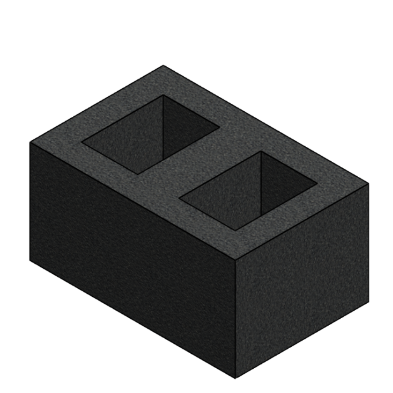
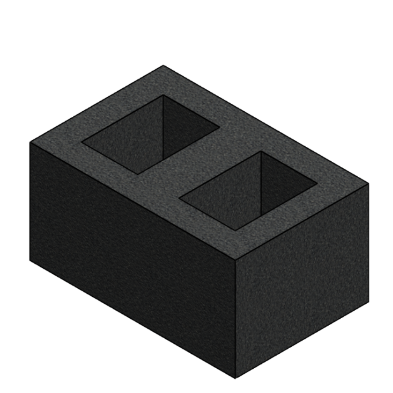
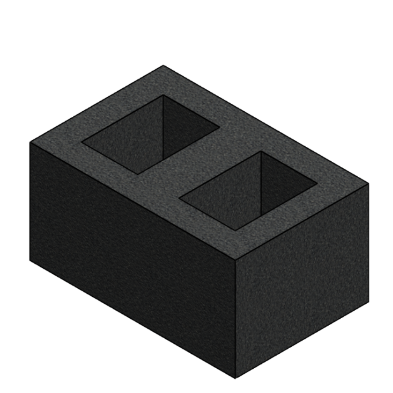
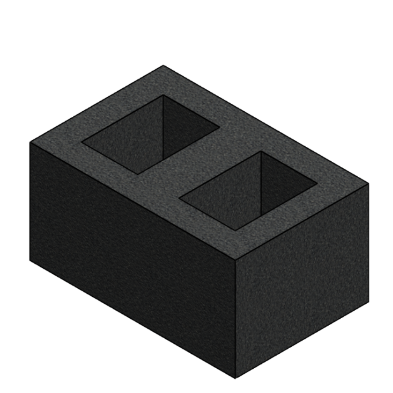
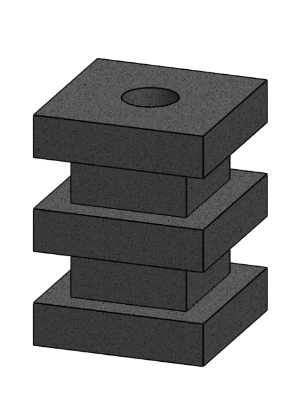
...
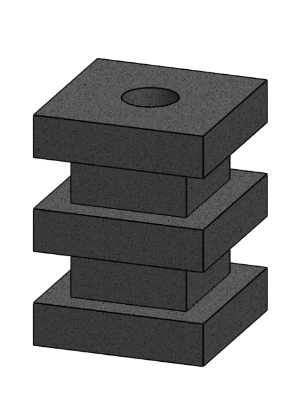
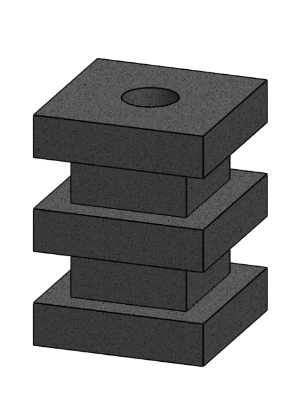
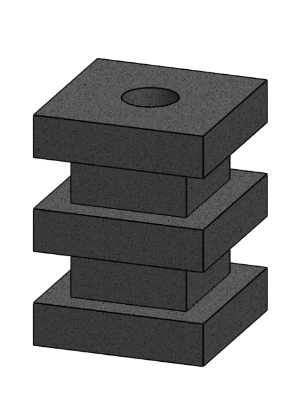
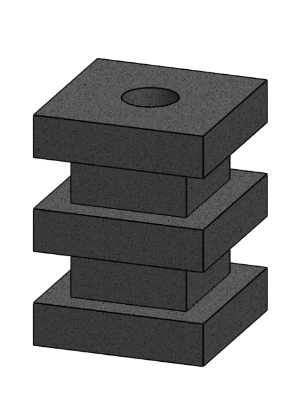
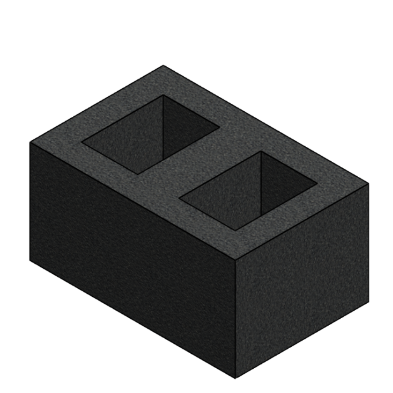

In [18]:
from IPython.display import Image, display
import folium

m_polygon = folium.Map(location=[df_latlon['Easting_lat'].mean(), df_latlon['Easting_lon'].mean()], zoom_start=15, tiles='CartoDB Positron')

# Add a color-coded polygon for each point
for idx, row in df_latlon.iterrows():
    polygon_points = [
        [row['NW_lat'], row['NW_lon']],
        [row['NE_lat'], row['NE_lon']],
        [row['SE_lat'], row['SE_lon']],
        [row['SW_lat'], row['SW_lon']]
    ]
    Type = df_POLYGON['Type'][idx]
    Status = df_POLYGON['Status'][idx]
    Display = df_POLYGON['Display'][idx]
    outline = ''
    fill_color = ''

    if pd.notna(Status):
        fill_color = '#025B72' if (Status == 'In progress' and Display == 'In progress') else '#025B72' if (Status == 'Scheduled' and Display == 'Next 90 days') else '#88A092' if Status == 'Installed' else 'white'

    # Add marker with name and notes to the center of the polygon
    polygon_center = [sum(p[0] for p in polygon_points) / len(polygon_points),
                      sum(p[1] for p in polygon_points) / len(polygon_points)]
    East = df_POLYGON['Easting'][idx]
    North = df_POLYGON['Northing'][idx]
    Min_depth = df_POLYGON['Min. Depth'][idx]
    Max_Depth = df_POLYGON['Max. depth'][idx]
    Water_Depth = f'{Min_depth}-{Max_Depth}'
    Substrate_depth = df_POLYGON['Substrate Depth'][idx]

    Date = df_POLYGON['Forecast'][idx]
    Design = df_POLYGON['Design'][idx]

    design_5 = 'C:/Users/Samob/Kelp Blue/Forestry - Engineering - Documents/Namibia/B. Development Plan/Development Plan - Input/Logos & Legends/Breeze.png'
    design_6 = 'C:/Users/Samob/Kelp Blue/Forestry - Engineering - Documents/Namibia/B. Development Plan/Development Plan - Input/Logos & Legends/Stackable.png'

    image_path = design_5 if Design == '5' else design_6 if Design == '6' else ''

    marker_name = df_POLYGON['Plot tag'][idx]  # You can customize the name as needed
    marker_notes = Status  # row['notes'] # You can customize the notes as needed

    tooltip_content = f'<div style="text-align: center;"> Tag:{marker_name}<br> Status:{Display} <br> Water Depth:{Water_Depth}</div>'

    html = f'<div style="text-align: center;">Easting: {East}<br>Northing: {North}<br>'
    if image_path:
        html += f'<img src="data:image/png;base64,{Image(image_path)._repr_png_()}" width="150px"/>'
    html += '</div>'
    polygon = folium.Polygon(polygon_points,
                            popup=folium.Popup(html, max_width=300),
                            tooltip=tooltip_content,
                            color='grey',
                            fill_color=fill_color,
                            fill_opacity=0.5, weight=1).add_to(m_polygon)

# Save the map to a local HTML file
m_polygon


### 5.2) BB Anchor Maps


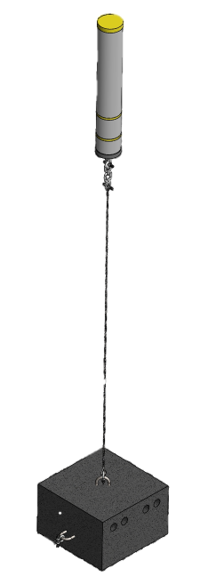
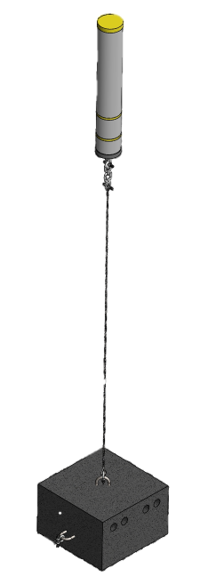
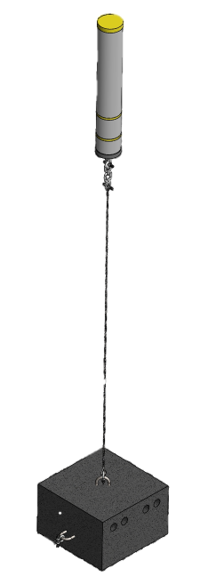
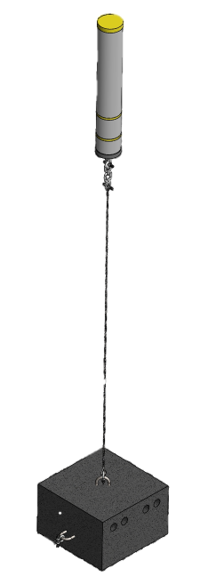
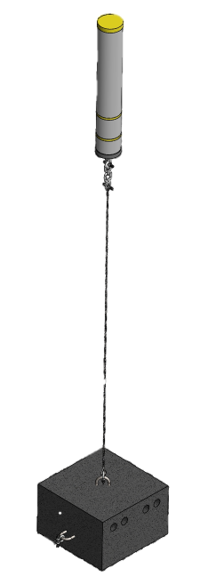
...
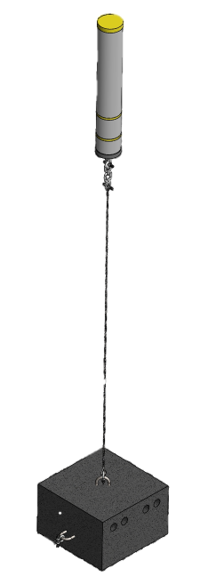
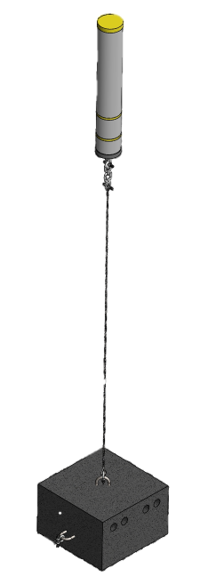
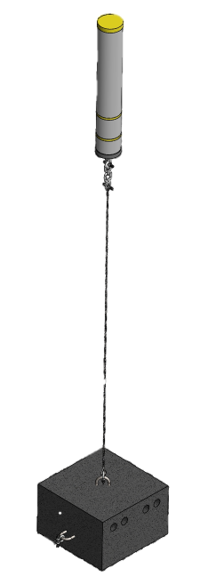
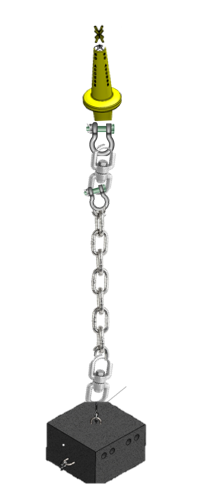
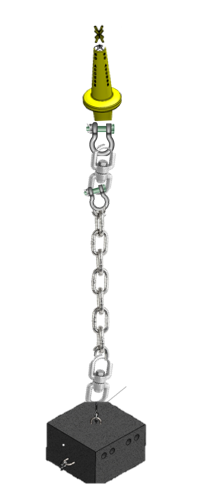

In [19]:
m_bb_anchor = folium.Map(location=[df_latlon['Easting_lat'].mean(), df_latlon['Easting_lon'].mean()], zoom_start=15, tiles='CartoDB Positron')
for idx, row in df_bb_anchors_latlon.iterrows():
    square_points = [
        [row['lat'] - 0.0001, row['lon'] - 0.0001],  # Bottom left corner
        [row['lat'] + 0.0001, row['lon'] - 0.0001],  # Bottom right corner
        [row['lat'] + 0.0001, row['lon'] + 0.0001],  # Top right corner
        [row['lat'] - 0.0001, row['lon'] + 0.0001],  # Top left corner
    ]
    East = round(df_bb_anchors['Easting'][idx],1)
    North = round(df_bb_anchors['Northing'][idx],1)
    Status = df_bb_anchors['Status'][idx]
    Tag = df_bb_anchors['#'][idx]
    Type = df_bb_anchors['Type'][idx]
    Depth = df_bb_anchors['Depth (m)'][idx]
    Design = df_bb_anchors['Design'][idx]

    if Design == 'BB':
        image_path = 'C:/Users/Samob/Kelp Blue/Forestry - Engineering - Documents/Namibia/B. Development Plan/Development Plan - Input/Logos & Legends/Point.png'
    elif Design == 'DB':
        image_path = 'C:/Users/Samob/Kelp Blue/Forestry - Engineering - Documents/Namibia/B. Development Plan/Development Plan - Input/Logos & Legends/Demarcation.png'
    else:
        image_path = None  # Specify a default image or set to None if no image is needed

    

    html = f'<div style="text-align: center;">Easting: {East}<br>Northing:{North}'

    if image_path:
            html += f'<img src="data:image/png;base64,{Image(image_path)._repr_png_()}" width="75px"/>'
    html += '</div>'
    
    outline = 'grey'
    if pd.notna(Status):
        fill_color = '#025B72' if (Status == 'In progress' and Display == 'In progress') else '#025B72' if (Status == 'Scheduled' and Display == 'Next 90 days') else '#88A092' if Status == 'Installed' else 'white'
    
    circle_radius = 10 # Set the desired radius for the circle
    
    folium.Circle(location=(row['lat'], row['lon']),
                  radius=circle_radius,
                  color=outline,
                  weight=1,
                  fill_opacity=0.6,
                  tooltip= f'<div style="text-align: center;">Tag:{Tag}<br>Depth:{Depth}</div>',
                  popup=folium.Popup(html, max_width=300),
                  fill=False,
                  fill_color=fill_color,
                
                  ).add_to(m_bb_anchor)
m_bb_anchor

### 5.3) Plotting NM Anchorcs

In [20]:
# Assuming df_nm_anchors_latlon is your DataFrame with latitude and longitude information
# and df_bb_anchors is the DataFrame containing information about BB anchors

m_nm_anchor = folium.Map(location=[df_latlon['Easting_lat'].mean(), df_latlon['Easting_lon'].mean()], zoom_start=15, tiles='CartoDB Positron')

for idx, row in df_nm_anchors_latlon.iterrows():
    square_points = [
        [row['lat'] - 0.00001, row['lon'] - 0.00001],  # Bottom left corner
        [row['lat'] + 0.00001, row['lon'] - 0.00001],  # Bottom right corner
        [row['lat'] + 0.00001, row['lon'] + 0.00001],  # Top right corner
        [row['lat'] - 0.00001, row['lon'] + 0.00001],  # Top left corner
    ]
   
    # Assuming df_nm_anchors is your DataFrame containing information about BB anchors
    East = (df_nm_anchors['Easting'][idx])
    North = (df_nm_anchors['Northing'][idx])
    Status = df_nm_anchors['Status'][idx]
    Type = df_nm_anchors['Type'][idx]
    
    
    

    popup_content = f'<div style="text-align: center;">Easting: {East}<br>Northing: {North}<br> Status: {Status}</div>'

    

    if Type == 'Blocks':
        color = 'green' if Status == 'Installed' else '#025B72' if Status == 'Scheduled' else 'red'
        folium.Polygon(
            locations=square_points,
            tooltip='Tag',
            popup=popup_content,
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=1
        ).add_to(m_nm_anchor)

    elif Type == 'Buoys':
        color = 'green' if Status == 'Installed' else '#025B72' if Status == 'Scheduled' else 'red'
        folium.CircleMarker(
            location=(row['lat'], row['lon']),
            tooltip='Tag',
            popup=popup_content,
            color=color,
            fill=True,
            fill_color=color,
            radius=2
        ).add_to(m_nm_anchor)

# Display the map
m_nm_anchor

### 5.4) Plotting license areas

In [21]:
def transform_filename(filename):
    # Replace 'Plot' with 'License Area' and remove the '.kml' extension
    return filename.replace("Plot", "License Area").replace(".kml", "")
# Extract Coordinates from All KML Files
all_coordinates = {file.split("/")[-1]: extract_coordinates_from_kml(file) for file in kml_files}

# Create Folium Map
m_license_area = folium.Map(location=[df_latlon['Easting_lat'].mean(), df_latlon['Easting_lon'].mean()], zoom_start=15, tiles='CartoDB Positron')

# Add Polygons to the Map
for filename, coords in all_coordinates.items():
    for polygon in coords:
        # Transform the filename to the desired popup format
        popup_content = transform_filename(filename)
        tooltip_content = transform_filename(filename)
#         popup = Popup(popup_content, max_width=300)  # Adjust max_width as needed
        
        folium.Polygon(
            locations=polygon, 
            fill=True,
            tooltip=tooltip_content,
            color="#3388ff",
            weight=1,
            fill_color="#3388ff",
            fill_opacity=0.2
        ).add_to(m_license_area)


#m_license_area.save("C:/Users/Ssach/OneDrive - Kelp Blue/Documents - Forestry - Engineering/Namibia/B. Development Plan/Development Plan - Output/license_area_map.html")
m_license_area


### 5.4) Plotting Depth Lines

In [22]:
import folium
import os
import xml.etree.ElementTree as ET
import re
import numpy as np

linepath_kml = 'C:/Users/Samob/Kelp Blue/Forestry - Engineering - Documents/Namibia/B. Development Plan/Development Plan - Input/Depth Lines/'

# Get a list of all KML files in the folder
kml_files = [file for file in os.listdir(linepath_kml) if file.endswith('.kml')]

# Function to extract coordinates from KML
def extract_coordinates(path_kml):
    tree = ET.parse(path_kml)
    root = tree.getroot()
    namespace = re.match(r'\{(.*?)\}kml', root.tag).group(1)
    ns = {'def': namespace}
    coord_ex = '(-?\d+\.\d+),'
    heig_ex = '(\d+)'
    regex = coord_ex + coord_ex + heig_ex
    
    coordinates_list = []

    for i in root.findall('.//def:Placemark', ns):
        name = i.find('def:name', ns).text
        coord = i.find('.//def:coordinates', ns)
        
        if coord is not None:
            coord = coord.text.strip()
            coord = re.findall(regex, coord)
            
            pin = 0
            for (long, lat, heig) in coord:
                pin += 1
                coordinates_list.append((float(lat), float(long)))

    return coordinates_list

# Create the map and add the lines
m_depth = folium.Map(location=[df_latlon['Easting_lat'].mean(), df_latlon['Easting_lon'].mean()], zoom_start=15, tiles='CartoDB Positron')
Water_Depth = np.arange(5.5, 20.5, 0.5)
count = 0

# Iterate over both kml_files using enumerate
for count, (kml_file, water_depth) in enumerate(zip(kml_files, Water_Depth)):
    # Construct the full path to the KML file
    full_path = os.path.join(linepath_kml, kml_file)

    # Extract coordinates from KML
    coordinates = extract_coordinates(full_path)
    start_point = coordinates[0]
    tooltip_text =Water_Depth[count]
    # Add PolyLine to the map
    folium.PolyLine(
        locations=coordinates,
        color='grey',
        weight=1,
    ).add_to(m_depth)
    folium.Marker(location=start_point,popup=tooltip_text,icon=folium.DivIcon(html=f"""<div style = "font-family:courier new; color:blue">{tooltip_text}</div>""")).add_to(m_depth)

    
   

# Display the map
m_depth


<>:18: SyntaxWarning: invalid escape sequence '\d'
<>:19: SyntaxWarning: invalid escape sequence '\d'
<>:18: SyntaxWarning: invalid escape sequence '\d'
<>:19: SyntaxWarning: invalid escape sequence '\d'
C:\Users\Samob\AppData\Local\Temp\ipykernel_19992\4053947768.py:18: SyntaxWarning: invalid escape sequence '\d'
  coord_ex = '(-?\d+\.\d+),'
C:\Users\Samob\AppData\Local\Temp\ipykernel_19992\4053947768.py:19: SyntaxWarning: invalid escape sequence '\d'
  heig_ex = '(\d+)'


### 5.5) Highlighting Tag Info

In [23]:

m_info_tag = folium.Map(location=[df_latlon['Easting_lat'].mean(), df_latlon['Easting_lon'].mean()], tiles='CartoDB Positron') 
for idx, row in df_latlon.iterrows():
    polygon_points = [
        [row['NW_lat'], row['NW_lon']],
        [row['NE_lat'], row['NE_lon']],
        [row['SE_lat'], row['SE_lon']],
        [row['SW_lat'], row['SW_lon']]
    ]

    # Add marker with name and notes to the center of the polygon
    polygon_center = [sum(p[0] for p in polygon_points) / len(polygon_points),
                      sum(p[1] for p in polygon_points) / len(polygon_points)]
    
    Tag = df_POLYGON['Plot tag'][idx]
    Min_depth = df_POLYGON['Min. Depth'][idx]
    Max_Depth = df_POLYGON['Max. depth'][idx]
    Water_Depth = f'{Min_depth}-{Max_Depth}'

    Status = df_POLYGON['Status'][idx]   
    
    if pd.notna(Tag):
        # Calculate the bounding box of the polygon to get its size
        bounds = folium.Polygon(polygon_points).get_bounds()
        polygon_size = max(bounds[1][0] - bounds[0][0], bounds[1][1] - bounds[0][1])
        
        # Create a text marker using DivIcon with dynamically calculated icon size
        text_marker = folium.Marker(
            location=polygon_center,
            icon=folium.DivIcon(
                html = f'<div text-align: center; style="margin-top: 0px; white-space: nowrap; ">{Tag}</div>'))


        text_marker.add_to(m_info_tag)


### 5.5.1) Water Depth Tag

In [24]:

m_info_depth = folium.Map(location=[df_latlon['Easting_lat'].mean(), df_latlon['Easting_lon'].mean()], tiles='CartoDB Positron') 
for idx, row in df_latlon.iterrows():
    polygon_points = [
        [row['NW_lat'], row['NW_lon']],
        [row['NE_lat'], row['NE_lon']],
        [row['SE_lat'], row['SE_lon']],
        [row['SW_lat'], row['SW_lon']]
    ]

    # Add marker with name and notes to the center of the polygon
    polygon_center = [sum(p[0] for p in polygon_points) / len(polygon_points),
                      sum(p[1] for p in polygon_points) / len(polygon_points)]
    
    Tag = df_POLYGON['Plot tag'][idx]
    Min_depth = df_POLYGON['Min. Depth'][idx]
    Max_Depth = df_POLYGON['Max. depth'][idx]
    Water_Depth = f'{Min_depth}-{Max_Depth}'

    Status = df_POLYGON['Status'][idx]   
    
    if pd.notna(Tag):
        # Calculate the bounding box of the polygon to get its size
       
        
        # Create a text marker using DivIcon with dynamically calculated icon size
        text_marker = folium.Marker(
            location=polygon_center,
            icon=folium.DivIcon(
                html = f'<div text-align: center; style="margin-top: 20px; white-space: nowrap; ">{Water_Depth}</div>'))


        text_marker.add_to(m_info_depth)

m_info_depth



### 5.5) Highlighting Quater Tag

In [25]:
m_info_quater = folium.Map(location=[df_latlon['Easting_lat'].mean(), df_latlon['Easting_lon'].mean()], tiles='CartoDB Positron',zoom_start=15, control_scale=True, prefer_canvas=True) 
for idx, row in df_latlon.iterrows():
    polygon_points = [
        [row['NW_lat'], row['NW_lon']],
        [row['NE_lat'], row['NE_lon']],
        [row['SE_lat'], row['SE_lon']],
        [row['SW_lat'], row['SW_lon']]
    ]

    # Add marker with name and notes to the center of the polygon
    polygon_center = [sum(p[0] for p in polygon_points) / len(polygon_points),
                      sum(p[1] for p in polygon_points) / len(polygon_points)]
    
    Tag = df_POLYGON['Plot tag'][idx]
    Status = df_POLYGON['Status'][idx]   
    Display = df_POLYGON['Display'][idx]   
    
    
    if pd.notna(Status):

        # Calculate the bounding box of the polygon to get its size
        bounds = folium.Polygon(polygon_points).get_bounds()
        polygon_size = max(bounds[1][0] - bounds[0][0], bounds[1][1] - bounds[0][1])

        # Create a text marker using DivIcon with dynamically calculated icon size
        text_marker = folium.Marker(
            location=polygon_center,
            icon=folium.DivIcon(
                html = f'<div style="margin-top: 0px; white-space: nowrap; text-align: center;">{Tag}</br>{Display}</div>'))

        text_marker.add_to(m_info_quater)


### 6) Combining Map

In [26]:
import folium
from folium.plugins import FloatImage

# Assuming m_anchor and m_license_area are your two maps

min_zoom = 10
max_zoom = 20

# Calculate the step size for the linear increase
step_size = (max_zoom - min_zoom) / len(df_latlon)

# Create FeatureGroups for each map
m_combined = folium.Map(location=[df_latlon['Easting_lat'].mean(), df_latlon['Easting_lon'].mean()], 
                        zoom_start=min_zoom, 
                        tiles='CartoDB Positron',
                        control_scale=True, 
                        prefer_canvas=True)

fg_license_area = folium.FeatureGroup(name='License Areas', show=True).add_to(m_combined)
fg_polygon = folium.FeatureGroup(name='Plot Map', show=True).add_to(m_combined)
fg_bb_anchor = folium.FeatureGroup(name='Block Anchors', show=True).add_to(m_combined)
fg_nm_anchor = folium.FeatureGroup(name='Netting Details', show=True).add_to(m_combined)
fg_info_tag = folium.FeatureGroup(name='Tag Info', show=True).add_to(m_combined)
fg_depth = folium.FeatureGroup(name='Depth Lines', show=False).add_to(m_combined)
fg_info_depth = folium.FeatureGroup(name='Depth Info', show=False).add_to(m_combined)

# Add features from m_anchor to fg_ancho
# Add features from m_license_area to fg_license_area
# Assuming m_license_area contains Polygons, adjust as needed

for layer in m_polygon._children.values():
    layer.add_to(fg_polygon)

for layer in m_bb_anchor._children.values():
    layer.add_to(fg_bb_anchor)

for layer in m_nm_anchor._children.values():
    layer.add_to(fg_nm_anchor)

for layer in m_info_tag._children.values():
    layer.add_to(fg_info_tag)   

for layer in m_info_depth._children.values():
    layer.add_to(fg_info_depth) 

for layer in m_license_area._children.values():
    layer.add_to(fg_license_area)

for layer in m_depth._children.values():
    layer.add_to(fg_depth)

# Adjust the zoom level for each feature group based on the step size
for fg in [fg_polygon, fg_bb_anchor, fg_nm_anchor, fg_info_tag, fg_license_area, fg_info_depth, fg_depth]:
    fg.add_child(folium.ClickForMarker(popup='Feature Group')).add_to(m_combined)

# Add LayerControl to switch between maps
folium.LayerControl().add_to(m_combined)


### Add legend and Logo

In [27]:
from folium import IFrame
import base64
legend_url = 'C:/Users/Samob/Kelp Blue/Forestry - Engineering - Documents/Namibia/B. Development Plan/Development Plan - Input/Logos & Legends/Legend.png'
logo_url = 'C:/Users/Samob/Kelp Blue/Forestry - Engineering - Documents/Namibia/B. Development Plan/Development Plan - Input/Logos & Legends/Logo.png'
legend_size = (1,1)
logo_position =  (37.7749,-122.4194)


with open(logo_url, 'rb') as lf:
  # open in binary mode, read bytes, encode, decode obtained bytes as utf-8 string
  logo = base64.b64encode(lf.read()).decode('utf-8')

with open(legend_url, 'rb') as lf:
  # open in binary mode, read bytes, encode, decode obtained bytes as utf-8 string
  legend = base64.b64encode(lf.read()).decode('utf-8')

FloatImage('data:image/png;base64,{}'.format(legend),bottom=30, left=5,width='300px',height='100px').add_to(m_combined)
FloatImage('data:image/png;base64,{}'.format(logo),top=0, left=0,width='200px',height='200px').add_to(m_combined)

# Save or display the combined map
m_combined.save(file_output)